# Week 7 & 8: Putting it all together!

## Clear the entire workspace

In [1]:
rm(list=ls())

## Load libraries

In [3]:
ReqdLibs = c("here","ggplot2","dplyr","tidyr","stringr","janitor","broom","emmeans","ggthemes")
invisible(lapply(ReqdLibs, library, character.only = TRUE))

## Check and set data directory
<font color = 'orange'> ***Recap Week 1*** learning </font> <br>
We want to know where we are and where we need to get the data from.

In [4]:
# let's look at our current directory
folder_path = getwd()

# we need to navigate into one more layer to read the data files
subfolder_path = paste0(folder_path,'/data/')

# list all the files within the 'data' folder
file_list =list.files(subfolder_path)

# take a look to make sure the files you're expecting in the data folder are present
file_list

[1] "QA1_T1_Barefoot1.txt" "QA1_T1_Barefoot2.txt" "QA1_T1_Barefoot3.txt"
 [4] "QA1_T1_Barefoot4.txt" "QA1_T2_Barefoot1.txt" "QA1_T2_Barefoot2.txt"
 [7] "QA1_T2_Barefoot3.txt" "QA1_T2_Barefoot5.txt" "QA1_T3_Barefoot4.txt"
[10] "QA1_T3_Barefoot5.txt" "QA1_T3_Barefoot6.txt"

## Import data
<font color = 'orange'> ***Recap Week 2*** learning </font> <br>
Let's start by importing one file in to see what lines of code we need.
Then, we will do this recursively using `for-loops`.

### What lines of code do we need per file?
Run everything for the first file to get a sense for all the steps

In [6]:
# paste strings to create a file_path for the first item in the file_list
file_path0 = paste0(subfolder_path,file_list[1])

# read in that first file using the read.delim function
temp0 = read.delim(file_path0)

# pasting strings from the first and fourth row in the 
# for use as new column names next
new_names = paste(temp0[1,],temp0[4,])

# change column names to these new names
colnames(temp0) = new_names

# remove those initial 4 rows because they are no longer useful
temp1 = temp0[-c(1:4),]

# at this time, also clean up these names so there are no spaces. 
# we will use the clean_names function from the janitor package
temp1 = clean_names(temp1)

# rename first column to %gait
colnames(temp1)[1] = "perc_gait"

# convert to numeric
temp1[,-1] = apply(temp1[,-1],2,as.double)

# change data table into tibble (it's currently in vectors format)
temp1 = as_tibble(temp1)
      
# write a temporary variable that can help you assign identifiers (trial, session etc.)
temp1$fileName = substr(file_list[1],1,nchar(file_list[1])-4)

# have a look at your data
head(temp1,5)

# NOTE!!! This is one single file that you have read in so far. 
# Next, we will read in all files recursively.

perc_gait,left_ankle_angular_position_x,left_ankle_angular_position_y,left_ankle_angular_position_z,left_foot_progression_x,left_foot_progression_y,left_foot_progression_z,left_hip_angular_position_x,left_hip_angular_position_y,left_hip_angular_position_z,⋯,right_grf_x,right_grf_y,right_grf_z,trunk_left_position_x,trunk_left_position_y,trunk_left_position_z,trunk_right_position_x,trunk_right_position_y,trunk_right_position_z,fileName
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,4.026378,1.210450,-6.210010,4.727023,1.860281,-2.955018,47.63491,3.890734,7.032426,⋯,26.189180,0.565135,59.54464,1.272320,1.364384,0.386036,-2.598243,2.931554,1.601948,QA1_T1_Barefoot1
2,4.381411,0.430334,-6.378968,4.227979,2.801618,-2.175241,47.24509,4.596641,7.072709,⋯,10.642538,1.570850,177.54526,0.727941,1.031140,0.456037,-3.139704,2.363694,2.143385,QA1_T1_Barefoot1
3,4.942418,-0.132680,-6.622121,3.788620,3.584090,-1.563634,46.92090,5.407558,7.239258,⋯,-11.634778,3.745199,169.48271,0.133742,0.701048,0.470578,-3.733501,1.811826,2.553019,QA1_T1_Barefoot1
4,5.649685,-0.382537,-6.946462,3.398390,4.084312,-1.106544,46.69550,6.308265,7.664567,⋯,0.493447,4.391907,176.76891,-0.494060,0.370650,0.425918,-4.355091,1.284306,2.809837,QA1_T1_Barefoot1
5,6.428778,-0.339809,-7.384519,3.041794,4.272545,-0.767969,46.57108,7.276013,8.439258,⋯,20.227514,3.592591,198.42075,-1.143465,0.035333,0.317609,-4.981491,0.785983,2.899375,QA1_T1_Barefoot1


<font color = 'red'> **NOTE!!!**  This is one single file that you have read in so far. </font> <br>
But now we have all the lines of code you will need next when we will read in all files recursively.

### create an empty dataframe
We will need some place to put the data.

In [7]:
# preallocate an empty data frame which you will recursively fill in with data
data.raw = data.frame(list())

### recursively read in files from the data directory
Use a `for-loop`to do this. What's another way?

In [8]:
  for(j in 1:length(file_list)){
      
    # paste strings to create a file_path from where we will read data
    file_path =  paste0(subfolder_path,file_list[j])
      
    # read each file in file_list
    temp = read.delim(file_path)
      
    # change column names 
    colnames(temp) = paste(temp[1,],temp[4,])

    # remove first few (now) unnecessary rows
    temp = temp[-c(1:4),]
    
    # clean names
    temp = clean_names(temp)  
    
    # rename first column to %gait
    colnames(temp)[1] = "perc_gait"
      
    # convert to numeric
    temp[,-1] = apply(temp[,-1],2,as.double)

    # change data table into tibble (it's currently in vectors format)
    temp = as_tibble(temp)
      
    # write a temporary variable out of the file names which will help 
    # you assign identifiers (trial, session etc.)
    # without this variable, we can't discern the different trials or sessions
    temp$fileName = substr(file_list[j],1,nchar(file_list[j])-4)

    # combine data imported from different files into a single dataframe
    data.raw =rbind(data.raw,temp)
    
  }

# have a look at your data.raw dataframe
head(data.raw,7)

# that's it! you have your rawest form of data. Next, clean it!

perc_gait,left_ankle_angular_position_x,left_ankle_angular_position_y,left_ankle_angular_position_z,left_foot_progression_x,left_foot_progression_y,left_foot_progression_z,left_hip_angular_position_x,left_hip_angular_position_y,left_hip_angular_position_z,⋯,right_grf_x,right_grf_y,right_grf_z,trunk_left_position_x,trunk_left_position_y,trunk_left_position_z,trunk_right_position_x,trunk_right_position_y,trunk_right_position_z,fileName
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,4.026378,1.210450,-6.210010,4.727023,1.860281,-2.955018,47.63491,3.890734,7.032426,⋯,26.189180,0.565135,59.54464,1.272320,1.364384,0.386036,-2.598243,2.931554,1.601948,QA1_T1_Barefoot1
2,4.381411,0.430334,-6.378968,4.227979,2.801618,-2.175241,47.24509,4.596641,7.072709,⋯,10.642538,1.570850,177.54526,0.727941,1.031140,0.456037,-3.139704,2.363694,2.143385,QA1_T1_Barefoot1
3,4.942418,-0.132680,-6.622121,3.788620,3.584090,-1.563634,46.92090,5.407558,7.239258,⋯,-11.634778,3.745199,169.48271,0.133742,0.701048,0.470578,-3.733501,1.811826,2.553019,QA1_T1_Barefoot1
4,5.649685,-0.382537,-6.946462,3.398390,4.084312,-1.106544,46.69550,6.308265,7.664567,⋯,0.493447,4.391907,176.76891,-0.494060,0.370650,0.425918,-4.355091,1.284306,2.809837,QA1_T1_Barefoot1
5,6.428778,-0.339809,-7.384519,3.041794,4.272545,-0.767969,46.57108,7.276013,8.439258,⋯,20.227514,3.592591,198.42075,-1.143465,0.035333,0.317609,-4.981491,0.785983,2.899375,QA1_T1_Barefoot1
6,7.232831,-0.097753,-7.975707,2.709668,4.181955,-0.518801,46.51028,8.283491,9.538996,⋯,39.334137,2.676411,216.38422,-1.807093,-0.310191,0.142298,-5.592752,0.316713,2.816404,QA1_T1_Barefoot1
7,8.045587,0.243836,-8.707746,2.399153,3.866962,-0.336698,46.44544,9.300517,10.804104,⋯,53.552158,2.296539,251.16263,-2.480773,-0.671749,-0.099552,-6.173125,-0.129672,2.566994,QA1_T1_Barefoot1


## Data wrangling
<font color = 'orange'> ***Recap Week 3*** learning </font> <br>
We need some identifiers for plotting. We also don't want to plot all the variables one by one.

### add identifiers
the main line of code below is the `separate` function that will separate the fileName "QA1_T1_Barefoot1" by the underscore into "QA", "T1" & "Barefoot1". 
We will define these three parts into new variables:
1) the initial "QA" part will be the variable "prefix." We will remove this variable later because it's not that useful to us.
2) the "T1" part will be variable session. This is important because we care about comparing between sessions.
3) the "Barefoot1" part will be the variable "trial"

In [9]:
# let's create some new variables using the fileName variable in data.raw
data.raw %>% 
# below `separate` func will separate "QA_T1_Barefoot1" by the "_" separator
separate(fileName,into=c("prefix","session","trial"), sep = "_",fill="right",remove = TRUE) %>% 
# Now, we can remove the "QA" prefix variable 
select(!c("prefix")) %>% 
{.->>data.clean}

head(data.clean)

# now we have a clean version of our code and we can use this to 
# plot the variables one by one.

perc_gait,left_ankle_angular_position_x,left_ankle_angular_position_y,left_ankle_angular_position_z,left_foot_progression_x,left_foot_progression_y,left_foot_progression_z,left_hip_angular_position_x,left_hip_angular_position_y,left_hip_angular_position_z,⋯,right_grf_y,right_grf_z,trunk_left_position_x,trunk_left_position_y,trunk_left_position_z,trunk_right_position_x,trunk_right_position_y,trunk_right_position_z,session,trial
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,4.026378,1.210450,-6.210010,4.727023,1.860281,-2.955018,47.63491,3.890734,7.032426,⋯,0.565135,59.54464,1.272320,1.364384,0.386036,-2.598243,2.931554,1.601948,T1,Barefoot1
2,4.381411,0.430334,-6.378968,4.227979,2.801618,-2.175241,47.24509,4.596641,7.072709,⋯,1.570850,177.54526,0.727941,1.031140,0.456037,-3.139704,2.363694,2.143385,T1,Barefoot1
3,4.942418,-0.132680,-6.622121,3.788620,3.584090,-1.563634,46.92090,5.407558,7.239258,⋯,3.745199,169.48271,0.133742,0.701048,0.470578,-3.733501,1.811826,2.553019,T1,Barefoot1
4,5.649685,-0.382537,-6.946462,3.398390,4.084312,-1.106544,46.69550,6.308265,7.664567,⋯,4.391907,176.76891,-0.494060,0.370650,0.425918,-4.355091,1.284306,2.809837,T1,Barefoot1
5,6.428778,-0.339809,-7.384519,3.041794,4.272545,-0.767969,46.57108,7.276013,8.439258,⋯,3.592591,198.42075,-1.143465,0.035333,0.317609,-4.981491,0.785983,2.899375,T1,Barefoot1
6,7.232831,-0.097753,-7.975707,2.709668,4.181955,-0.518801,46.51028,8.283491,9.538996,⋯,2.676411,216.38422,-1.807093,-0.310191,0.142298,-5.592752,0.316713,2.816404,T1,Barefoot1


### manipulate the data
Convert it to long format so you can next plot all variables at once

In [10]:
# let's 
data.clean %>%
# I removed the "normalized torque" variables here because they didn't indicate 
select(!starts_with(match = "norm_")) %>% 
pivot_longer(cols = where(is.numeric), names_to = "measure", values_to = "value") %>% 
{.->> data.clean.longPlot}

data.clean.longPlot$perc_gait = as.numeric(data.clean.longPlot$perc_gait)
head(data.clean.longPlot)

perc_gait,session,trial,measure,value
<dbl>,<chr>,<chr>,<chr>,<dbl>
1,T1,Barefoot1,left_ankle_angular_position_x,4.026378
1,T1,Barefoot1,left_ankle_angular_position_y,1.210450
1,T1,Barefoot1,left_ankle_angular_position_z,-6.210010
1,T1,Barefoot1,left_foot_progression_x,4.727023
1,T1,Barefoot1,left_foot_progression_y,1.860281
1,T1,Barefoot1,left_foot_progression_z,-2.955018


## Visualize data
<font color = 'orange'> ***Recap Week 4*** learning </font> <br>
We need an initial version of a plot where we can see all our data as means and standard errors. We want its appearance to be large and clear enough to be visible to the (relatively old) human eye.

### set theme in advance so you can use it next

In [11]:
thm = theme(plot.title = element_text(size = 40),
          legend.title = element_text(size = 25),
          legend.position = "top",
          legend.text = element_text(size = 20),
          strip.text = element_text(size = 35),
          axis.ticks.length = unit(0.3,"cm"),
          axis.line = element_line(colour = "black",linewidth = 1),
          axis.ticks = element_line(colour = "black",linewidth = 1),
          axis.text = element_text(colour = "black",size = 40),
          axis.text.x = element_text(lineheight = 1.1, margin = margin(t = 10)),
          axis.title.x = element_text(size=40, colour = "grey35", face = "plain",
                                     lineheight = 1.1, margin = margin(r = 10)),
          axis.title.y = element_text(size=40, colour = "grey35", face = "plain",
                                     lineheight = 1.1, margin = margin(r = 10)))

custom_colors <- c("#e41a1c", "#13388e", "#03ac13")

### plot all variables at once from the long format data
What's one problem with this plot?

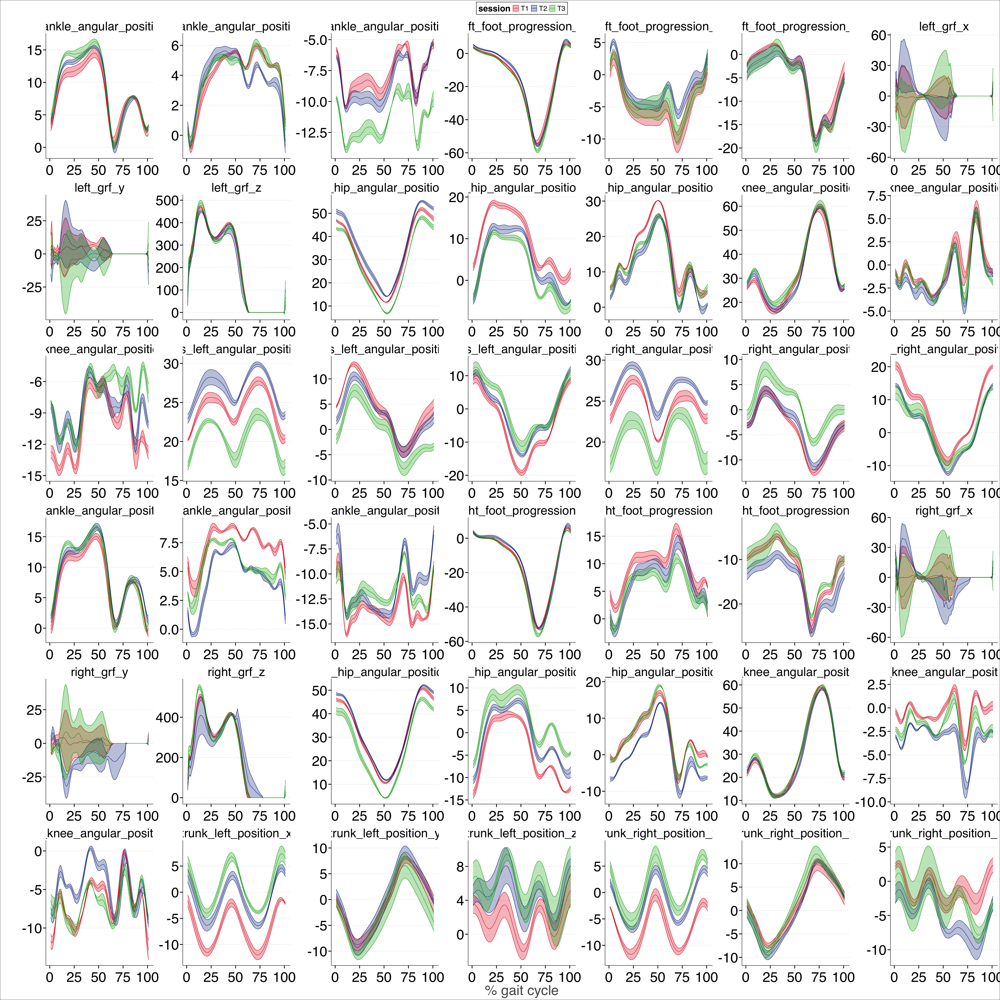

In [12]:
options(repr.plot.width = 40, repr.plot.height = 40)
all_vars = 
ggplot(data.clean.longPlot, aes(x = perc_gait,y = value, 
                                group = session, col = session, fill = session)) + 
stat_summary(geom = "line", fun = mean, na.rm = TRUE) + 
stat_summary(geom = "ribbon",fun.data = mean_se, na.rm = TRUE,alpha=0.3) + 
  scale_color_manual(values = custom_colors) +
  scale_fill_manual(values = custom_colors) +
xlab("% gait cycle") + ylab("") +
facet_wrap(~measure, scales = "free") + 
theme_clean() + thm
all_vars

# ggsave(file='all_vars.svg', plot=all_vars, width=35, height=35)


## Advanced data wrangling
<font color = 'orange'> ***Recap Week 4*** learning </font> <br>
More data manipulation using conditional sets to define new identifiers for the variable `variable`

### define conditional sets

In [13]:
# side of measure
sd = c("left","right")
# segment measured
sg = c("foot", "ankle","knee","hip","pelvis","trunk","grf")
# coordinate
cd = c("x","y","z")

### use conditional sets to define new variables side, segment, and coordinate
Let's take the long format of the data and `separate` the "measure" variable
into bits that are useful - e.g., the side, the segment, and the coordinate

In [14]:
data.clean.longPlot %>% 

  # an important note: i needed to know in advance how many  
  separate(measure, 
           into = c("part1", "part2", "part3", "part4", "part5"), 
           sep = "_", extra = "merge", fill = "right",remove = FALSE) %>% 

  mutate(side = case_when(part1 %in% sd ~ part1, part2 %in% sd ~ part2,
                          part3 %in% sd ~ part3, TRUE ~ NA_character_),
         
            # once moved, replace orig cells with NA
            part1 = if_else(part1 %in% sd, NA_character_, part1),
            part2 = if_else(part2 %in% sd, NA_character_, part2),
            part3 = if_else(part3 %in% sd, NA_character_, part3),
         
         
        segment = case_when(part1 %in% sg ~ part1, part2 %in% sg ~ part2,
                            part3 %in% sg ~ part3, TRUE ~ NA_character_),
         
            # once moved, replace orig cells with NA
            part1 = if_else(part1 %in% sg, NA_character_, part1),
            part2 = if_else(part2 %in% sg, NA_character_, part2),
            part3 = if_else(part3 %in% sg, NA_character_, part3), 

        coord = case_when(part3 %in% cd ~ part3, part4 %in% cd ~ part4,
                           part5 %in% cd ~ part5, TRUE ~ NA_character_),
         
            # once moved, replace orig cells with NA
            part3 = if_else(part3 %in% cd, NA_character_, part3),
            part4 = if_else(part4 %in% cd, NA_character_, part4),
            part5 = if_else(part5 %in% cd, NA_character_, part5),
         
        measure = if_else(is.na(part3),'force',part3)) %>% 

select(!c("part1", "part2", "part3", "part4", "part5")) %>% 

{.->>data.sorted.long}
head(data.sorted.long)

perc_gait,session,trial,measure,value,side,segment,coord
<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>
1,T1,Barefoot1,angular,4.026378,left,ankle,x
1,T1,Barefoot1,angular,1.210450,left,ankle,y
1,T1,Barefoot1,angular,-6.210010,left,ankle,z
1,T1,Barefoot1,progression,4.727023,left,foot,x
1,T1,Barefoot1,progression,1.860281,left,foot,y
1,T1,Barefoot1,progression,-2.955018,left,foot,z


### visualize again

#### right body segments

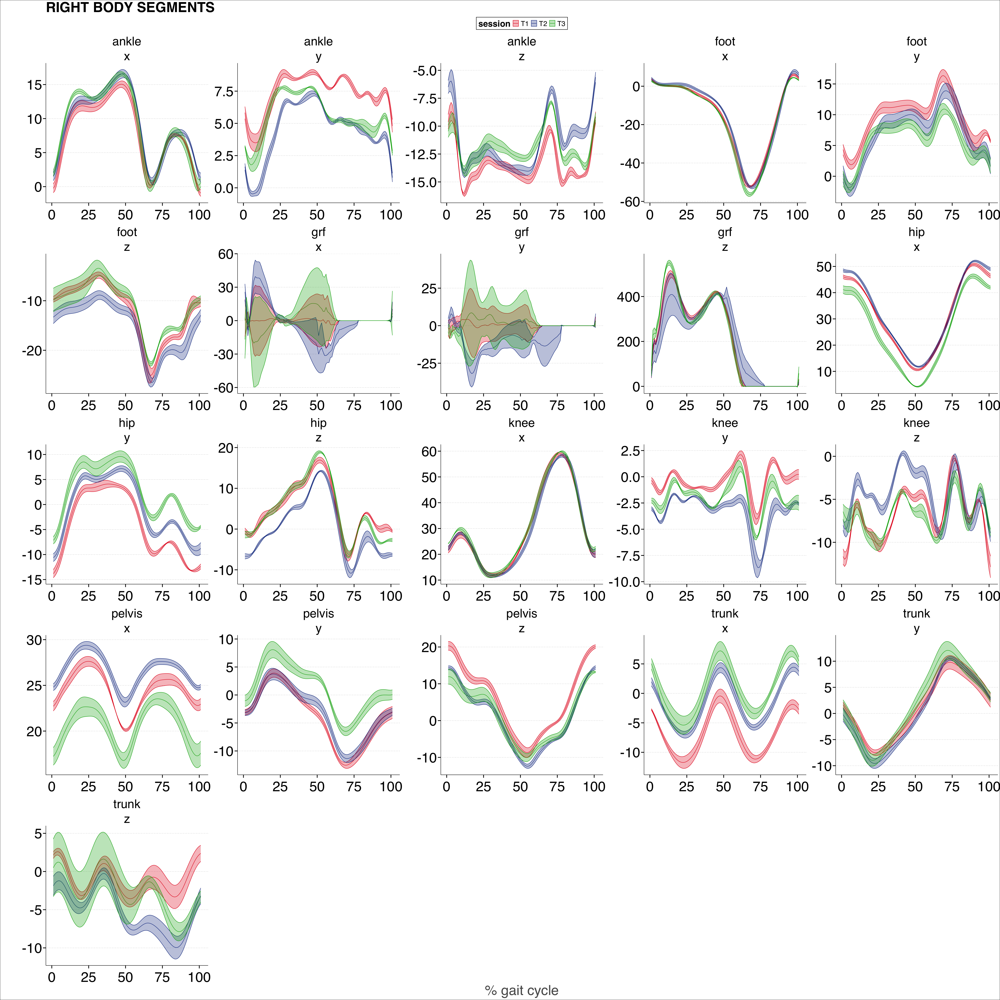

In [15]:
right_allVars =

ggplot(data.sorted.long %>% filter(side=="right"), aes(x = perc_gait,y = value, 
                                group = session, col = session, fill = session)) + 
stat_summary(geom = "line", fun = mean, na.rm = TRUE) + 
stat_summary(geom = "ribbon",fun.data = mean_se, na.rm = TRUE,alpha=0.3) + 
  scale_color_manual(values = custom_colors) +
  scale_fill_manual(values = custom_colors) +
xlab("% gait cycle") + ylab("") + ggtitle("RIGHT BODY SEGMENTS") +
facet_wrap(segment~coord, scales = "free") + 
theme_clean() + thm

right_allVars

# ggsave(file='right_allVars.svg', plot=right_allVars, width=35, height=35)


#### left body segments

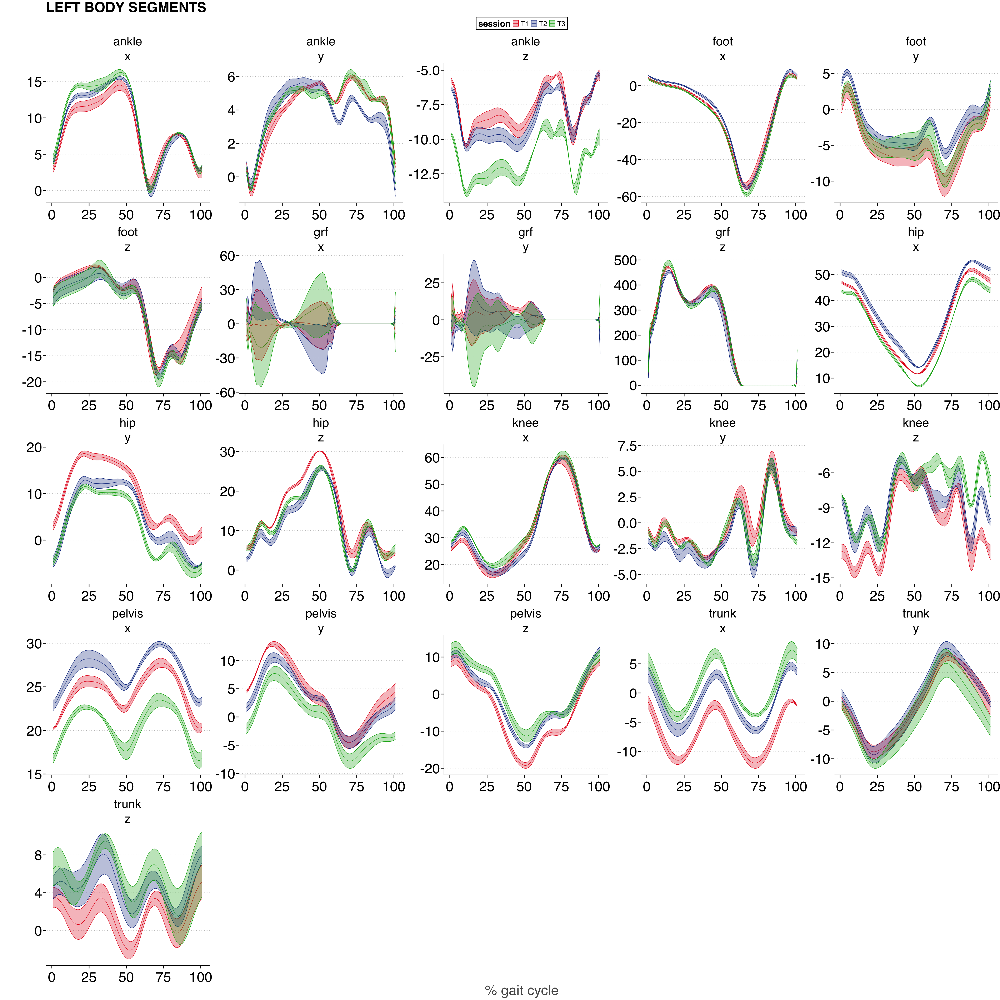

In [16]:
left_allVars = 
ggplot(data.sorted.long %>% filter(side=="left"), aes(x = perc_gait,y = value, 
                                group = session, col = session, fill = session)) + 
stat_summary(geom = "line", fun = mean, na.rm = TRUE) + 
stat_summary(geom = "ribbon",fun.data = mean_se, na.rm = TRUE,alpha=0.3) + 
  scale_color_manual(values = custom_colors) +
  scale_fill_manual(values = custom_colors) +
xlab("% gait cycle") + ylab("") + ggtitle("LEFT BODY SEGMENTS") +
facet_wrap(segment~coord, scales = "free") + 
theme_clean() + thm

left_allVars

# ggsave(file='left_allVars.svg', plot=left_allVars, width=35, height=35)


***
## What did you find from visual analysis of the data?
One observation is that across sessions T1, T2, and T3, the hip, pelvis, and trunk traces seem to be more 'apart' from one another compared to other more distal markers. Specifically:
* On the `RIGHT` side segments:
    * `hip x, y & z` coord
    * `pelvis x, y & z` coord
    * `trunk x` coord
    * `ankle y & z` coord <br>
      <br>
* On the `LEFT` side segments:
    * `hip x, y & z` coord
    * `pelvis x` coord
    * `trunk x` coord


## Statistics
<font color = 'orange'> ***Recap Week 5*** learning </font> 

At this point, you have to be very specific about what measures you are interested in comparing. For example, there maybe some markers and coordinates you don't care about or some others that you absolutely do care about. Decide that because it is time to compare those measures across the 3 sessions.

### Summarize long-form data
For use in simple linear models next

In [17]:
data.sorted.long %>% 
group_by(perc_gait,session, side, segment, coord, measure) %>% 
# summarize_if(is.double,list(mean = mean, se = parameters::standard_error), 
#            .names = "{.col}_{.fn}") %>% 
summarize_if(is.double, ~ mean(., na.rm = TRUE))  %>% 
{.->>data.summ.long}
head(data.summ.long)

perc_gait,session,side,segment,coord,measure,value
<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>
1,T1,left,ankle,x,angular,2.9717613
1,T1,left,ankle,y,angular,0.5934137
1,T1,left,ankle,z,angular,-5.7480278
1,T1,left,foot,x,progression,4.0666320
1,T1,left,foot,y,progression,0.5521340
1,T1,left,foot,z,progression,-2.2964845


#### define segments that seemed most problematic during visual analysis

In [18]:
# problem segments for both left and right side
prob_segs = c("ankle","foot","trunk","pelvis","hip")

### Simple linear model

#### for right body segments

In [19]:
mod.right.x = lm(data = data.summ.long %>% filter(segment %in% prob_segs & side=="right" & coord=="x"), 
           value ~ session*segment)
mod.right.y = lm(data = data.summ.long %>% filter(segment %in% prob_segs & side=="right" & coord=="y"), 
           value ~ session*segment)
mod.right.z = lm(data = data.summ.long %>% filter(segment %in% prob_segs & side=="right" & coord=="z"), 
           value ~ session*segment)

# tidy(mod.right.x)
# glance(mod.right.x)
# glance(mod.right.y)
# glance(mod.right.z)

emm_interR.x = emmeans(mod.right.x, ~session|segment)
emm_interR.y = emmeans(mod.right.y, ~session|segment)
emm_interR.z = emmeans(mod.right.z, ~session|segment)

pairs(emm_interR.x, by = "segment") %>% tidy %>% filter(adj.p.value<0.05)
pairs(emm_interR.y, by = "segment") %>% tidy %>% filter(adj.p.value<0.05)
pairs(emm_interR.z, by = "segment") %>% tidy %>% filter(adj.p.value<0.05)


segment,term,contrast,null.value,estimate,std.error,df,statistic,adj.p.value
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
hip,session,T1 - T3,0,5.530643,1.562371,1500,3.539903,1.199383e-03
hip,session,T2 - T3,0,6.759247,1.562371,1500,4.326274,4.803105e-05
pelvis,session,T1 - T3,0,3.854094,1.562371,1500,2.466823,3.658956e-02
pelvis,session,T2 - T3,0,6.052885,1.562371,1500,3.874166,3.283478e-04
trunk,session,T1 - T2,0,-5.135281,1.562371,1500,-3.286851,2.975860e-03
trunk,session,T1 - T3,0,-7.497862,1.562371,1500,-4.799027,5.236343e-06


segment,term,contrast,null.value,estimate,std.error,df,statistic,adj.p.value
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ankle,session,T1 - T2,0,2.901917,0.6791903,1500,4.272613,6.095513e-05
ankle,session,T1 - T3,0,1.774887,0.6791903,1500,2.613239,2.456416e-02
foot,session,T1 - T2,0,2.373330,0.6791903,1500,3.494353,1.419049e-03
foot,session,T1 - T3,0,3.450094,0.6791903,1500,5.079716,1.272679e-06
hip,session,T1 - T2,0,-3.401831,0.6791903,1500,-5.008656,1.833322e-06
hip,session,T1 - T3,0,-6.762726,0.6791903,1500,-9.957042,0.000000e+00
hip,session,T2 - T3,0,-3.360895,0.6791903,1500,-4.948385,2.489426e-06
pelvis,session,T1 - T3,0,-4.977612,0.6791903,1500,-7.328744,0.000000e+00
pelvis,session,T2 - T3,0,-4.332307,0.6791903,1500,-6.378634,7.097655e-10


segment,term,contrast,null.value,estimate,std.error,df,statistic,adj.p.value
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ankle,session,T1 - T2,0,-2.006862,0.7866891,1500,-2.551023,2.917394e-02
foot,session,T1 - T2,0,3.055746,0.7866891,1500,3.884312,3.151568e-04
foot,session,T2 - T3,0,-4.024860,0.7866891,1500,-5.116201,1.053264e-06
hip,session,T1 - T2,0,4.644390,0.7866891,1500,5.903717,1.315328e-08
hip,session,T2 - T3,0,-4.580486,0.7866891,1500,-5.822486,2.122266e-08
pelvis,session,T1 - T2,0,4.937491,0.7866891,1500,6.276293,1.355879e-09
pelvis,session,T1 - T3,0,4.297279,0.7866891,1500,5.462487,1.644349e-07
trunk,session,T1 - T2,0,4.117699,0.7866891,1500,5.234214,5.663221e-07
trunk,session,T2 - T3,0,-2.468369,0.7866891,1500,-3.137667,4.937565e-03


#### for left body segments

In [20]:
mod.left.x = lm(data = data.summ.long %>% filter(segment %in% prob_segs & side=="left" & coord=="x"), 
           value ~ session*segment)
mod.left.y = lm(data = data.summ.long %>% filter(segment %in% prob_segs & side=="left" & coord=="y"), 
           value ~ session*segment)
mod.left.z = lm(data = data.summ.long %>% filter(segment %in% prob_segs & side=="left" & coord=="z"), 
           value ~ session*segment)

# tidy(mod.left.x)
# glance(mod.left.x)
# glance(mod.left.y)
# glance(mod.left.z)

emm_interL.x = emmeans(mod.left.x, ~session|segment)
emm_interL.y = emmeans(mod.left.y, ~session|segment)
emm_interL.z = emmeans(mod.left.z, ~session|segment)

pairs(emm_interL.x, by = "segment") %>% tidy %>% filter(adj.p.value<0.05)
pairs(emm_interL.y, by = "segment") %>% tidy %>% filter(adj.p.value<0.05)
pairs(emm_interL.z, by = "segment") %>% tidy %>% filter(adj.p.value<0.05)


segment,term,contrast,null.value,estimate,std.error,df,statistic,adj.p.value
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
hip,session,T2 - T3,0,7.129811,1.580936,1500,4.509868,2.082310e-05
pelvis,session,T1 - T3,0,3.790593,1.580936,1500,2.397690,4.382977e-02
pelvis,session,T2 - T3,0,6.266447,1.580936,1500,3.963759,2.278311e-04
trunk,session,T1 - T2,0,-5.392391,1.580936,1500,-3.410885,1.921148e-03
trunk,session,T1 - T3,0,-7.981923,1.580936,1500,-5.048860,1.492111e-06


segment,term,contrast,null.value,estimate,std.error,df,statistic,adj.p.value
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
foot,session,T1 - T2,0,-2.556528,0.6706452,1500,-3.812043,4.211433e-04
foot,session,T2 - T3,0,1.639877,0.6706452,1500,2.445223,3.873331e-02
hip,session,T1 - T2,0,4.820791,0.6706452,1500,7.188289,7.567280e-13
hip,session,T1 - T3,0,6.860683,0.6706452,1500,10.229974,0.000000e+00
hip,session,T2 - T3,0,2.039892,0.6706452,1500,3.041686,6.760041e-03
pelvis,session,T1 - T3,0,4.421047,0.6706452,1500,6.592229,1.771719e-10
pelvis,session,T2 - T3,0,3.174159,0.6706452,1500,4.732993,7.226464e-06
trunk,session,T1 - T3,0,1.618898,0.6706452,1500,2.413942,4.202688e-02
trunk,session,T2 - T3,0,2.286487,0.6706452,1500,3.409384,1.931527e-03


segment,term,contrast,null.value,estimate,std.error,df,statistic,adj.p.value
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ankle,session,T1 - T3,0,3.686549,0.8468783,1500,4.353104,4.259297e-05
ankle,session,T2 - T3,0,3.064235,0.8468783,1500,3.618271,8.938253e-04
hip,session,T1 - T2,0,3.639635,0.8468783,1500,4.297707,5.454591e-05
hip,session,T1 - T3,0,2.391315,0.8468783,1500,2.823682,1.333707e-02
pelvis,session,T1 - T2,0,-3.421410,0.8468783,1500,-4.040025,1.659122e-04
pelvis,session,T1 - T3,0,-5.239276,0.8468783,1500,-6.186574,2.371379e-09
trunk,session,T1 - T2,0,-3.137010,0.8468783,1500,-3.704204,6.430639e-04
trunk,session,T1 - T3,0,-3.900635,0.8468783,1500,-4.605898,1.328036e-05


# Conclusion
**What did you find?**<br><br>
I found that across sessions:
* Horizontal (side-to-side,`x coord`) placement of:
     * `PELVIS` markers varied by 3.5-6.5 cms
     * `TRUNK` markers varied by 5-8 cms
* Vertical placement (up-down, `y coord`) of:
     * `HIP` markers varied by 2-7 cms,
     * `PELVIS` markers varied by 3-4.5 cms
     * `TRUNK` markers varied by 1.6-2.3 cms, and
     * `FOOT` markers varied by 1.6-2.5 cms
* Transverse placement (`z coord`) of:
     * `ANKLE`, `HIP`, and `TRUNK` markers varied by 2-3 cms, and
     * `PELVIS` marker varied by 3-5 cms

<font color = 'green'> ***Recommendation*** <br>
Lab staff should receive training on marker placement especially for trunk, pelvis and hip. Additional measures could be taken to ensure the markers are not moving due to loose clothing, or arm/elbow knocking over markers. </font> 
